In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_context('poster')
sns.set(rc={'figure.figsize': (16., 9.)})
sns.set_style('whitegrid')
import folium
from folium import Map
from folium.plugins import HeatMap
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords


In [2]:
df = pd.read_csv("../data/total_df.csv", index_col="Unnamed: 0")

In [3]:
df.columns

Index(['id_web', 'lat', 'long', 'comment', 'language', 'sentiment',
       'type_sentiment', 'characters', 'emotionality', 'country_name',
       'country_code', 'region', 'income_group', 'mean_stability', 'mean_law',
       'mean_female_seats', 'mean_voice', 'mean_gdp', 'mean_children_out',
       'mean_ed_exp', 'mean_literacy', 'mean_ARV_coverage', 'mean_health_exp',
       'mean_UHC_coverage', 'mean_rights', 'mean_sex_index', 'censor',
       'transition', 'mean_hate_protection', 'cluster'],
      dtype='object')

Variables from the discourse: 
- Language
- Sentiment
- Type of sentiment
- Characters
- Emotionality

## Use

In [7]:
df["country_code"].value_counts()

country_code
USA    69976
GBR    13175
CAN    12690
AUS     7163
DEU     3697
       ...  
SSD        1
GNB        1
BEN        1
NCL        1
COG        1
Name: count, Length: 168, dtype: int64

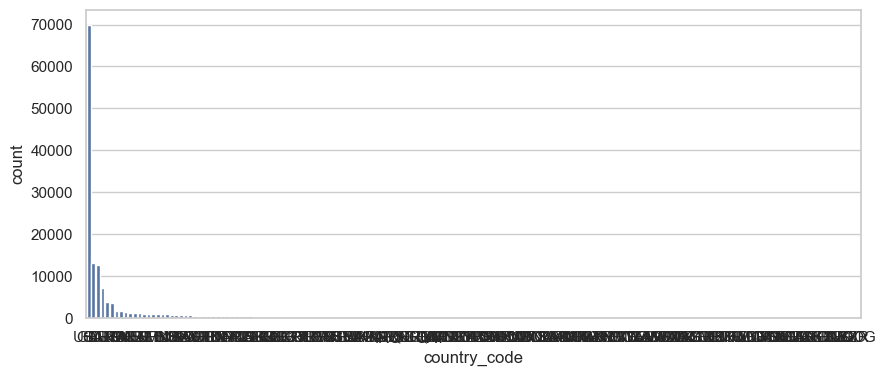

In [7]:
plt.figure(figsize=(10, 4))
sns.barplot(df["country_code"].value_counts().sort_values(ascending=False));

In [26]:
top_countries = pd.DataFrame(df["country_code"].value_counts().head(10))
top_countries

,count
country_code,
USA,69976
GBR,13175
CAN,12690
AUS,7163
DEU,3697
FRA,3502
ITA,1706
POL,1603
RUS,1339


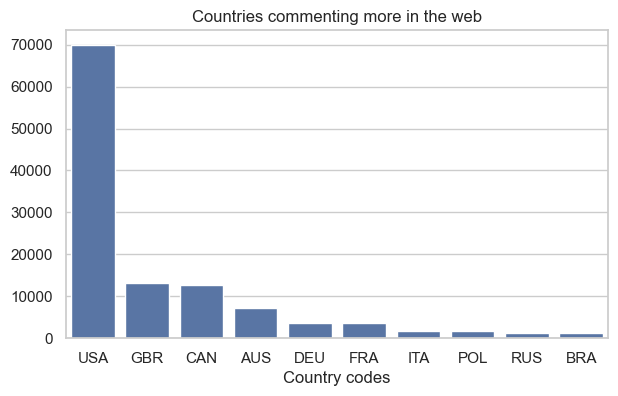

In [30]:
plt.figure(figsize=(7, 4))
sns.barplot(data = top_countries, x = "country_code", y = "count")
plt.title("Countries commenting more in the web")
plt.xlabel("Country codes" )
plt.ylabel("")
plt.savefig('../images/top_countries_use.png')

In [11]:
map_activity = Map(location = [0, 0], zoom_start = 2)
HeatMap(df[["lat", "long"]], min_opacity= 0, blur=0).add_to(map_activity)
map_activity

In [12]:
map_activity = Map(location = [0, 0], zoom_start = 2)
HeatMap(df[["lat", "long"]].loc[df[df["country_code"].notna()].index], min_opacity=0, blur=0).add_to(map_activity)
map_activity

**Tableau**

# Languages

In [13]:
lang = list(set(df["language"])) 
print(lang)

['cy', 'ru', 'sl', 'mn', 'uk', 'nn', 'jv', 'pt', 'ro', 'th', 'az', 'lv', 'no', 'mg', 'es', 'gl', 'ur', 'hy', 'sw', 'he', 'mk', 'de', 'bs', 'la', 'mr', 'ga', 'ar', 'ug', 'ka', 'an', 'be', 'ht', 'tl', 'sr', 'cs', 'en', 'id', 'vo', 'gu', 'af', 'km', 'lo', 'da', 'et', 'sv', 'ne', 'nl', 'lt', 'si', 'hi', 'hr', 'fa', 'ta', 'xh', 'bg', 'bn', 'eo', 'ku', 'ky', 'fr', 'am', 'el', 'sk', 'sq', 'is', 'ca', 'it', 'rw', 'wa', 'ko', 'pl', 'hu', 'mt', 'qu', 'nb', 'te', 'eu', 'vi', 'ja', 'br', 'fi', 'lb', 'ms', 'tr', 'oc', 'zh']


In [14]:
len(lang)

86

In [15]:
top_lang= pd.DataFrame(df["language"].value_counts().head(10))
top_lang

,count
language,
en,142688
fr,1696
es,1303
de,427
pt,317
it,295
nl,274
et,272
da,217


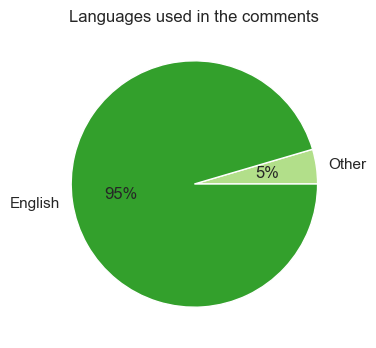

In [33]:
num_en = df.language[df["language"]=="en"].value_counts()["en"]
num_not_en = df.shape[0]-num_en
data = [num_not_en, num_en]
labels = [ 'Other', 'English']
plt.figure(figsize=(6, 4))
colors = sns.color_palette("Paired")[2:5]
plt.pie(data, labels = labels, colors=colors, autopct='%.0f%%')
plt.title("Languages used in the comments");
plt.savefig("../images/lang_english.png")
plt.show()

# A total of 85 languages including english (followed by french and spanish)

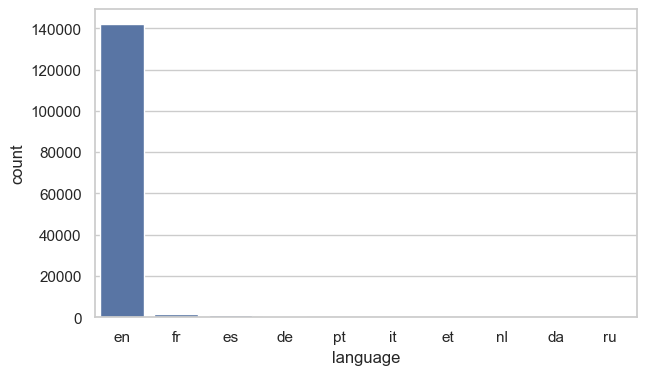

In [13]:
plt.figure(figsize=(7, 4))
sns.barplot(data = top_lang, x = "language", y = "count");

# Sentiment

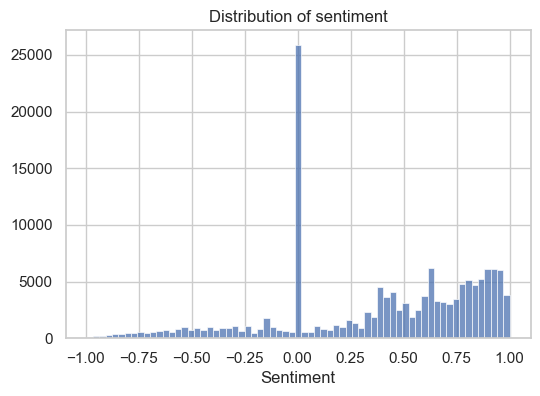

In [35]:
plt.figure(figsize=(6, 4))
sns.histplot(df["sentiment"])
plt.title("Distribution of sentiment")
plt.xlabel("Sentiment")
plt.ylabel("")
plt.savefig("../images/Sentiment.png")

In [15]:
df["sentiment"][df["sentiment"] == 0].shape, f'{df["sentiment"][df["sentiment"] == 0].shape[0]/df.shape[0]*100}%'

((25038,), '16.83623037353327%')

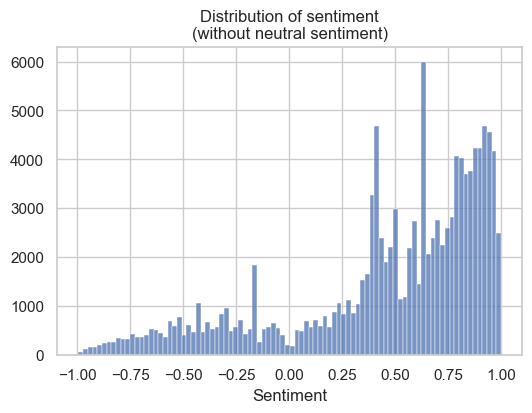

In [36]:
plt.figure(figsize=(6, 4))
sns.histplot(df["sentiment"][df["sentiment"] !=0])
plt.title("Distribution of sentiment\n(without neutral sentiment)")
plt.xlabel("Sentiment")
plt.ylabel("")
plt.savefig("../images/Sentiment_no_neutral.png")

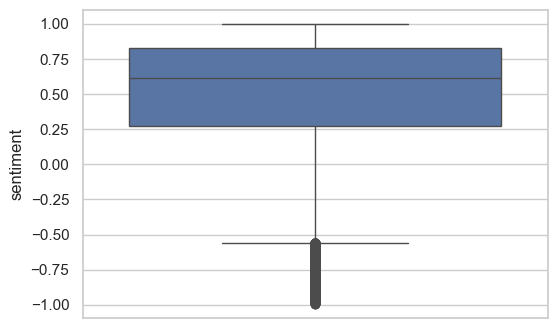

In [17]:
plt.figure(figsize=(6, 4))
sns.boxplot(df["sentiment"][df["sentiment"]!=0]);

-0.5576499999999999


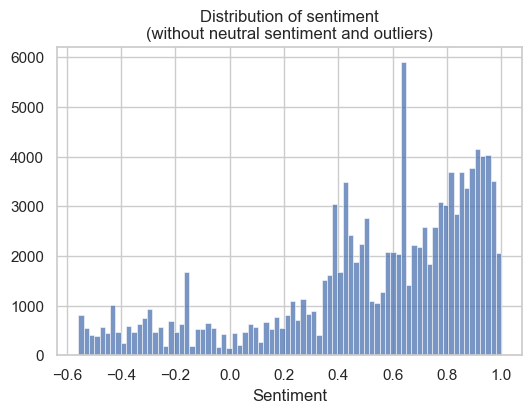

In [37]:
Q1_sens = df["sentiment"][df["sentiment"]!=0].quantile(0.25)
Q3_sens = df["sentiment"][df["sentiment"]!=0].quantile(0.75)
IQR = Q3_sens - Q1_sens
outlier_inf_sens = Q1_sens - 1.5 * IQR
plt.figure(figsize=(6, 4))
sns.histplot(df["sentiment"][(df["sentiment"] !=0) & (df["sentiment"]>outlier_inf_sens)])
plt.title("Distribution of sentiment\n(without neutral sentiment and outliers)")
plt.xlabel("Sentiment")
plt.ylabel("")
plt.savefig("../images/Sentiment_no_neutral_no_outliers.png")
print(outlier_inf_sens)

In [243]:
index = df[df["sentiment"] == df["sentiment"].max()].index[0]
print(df["country_name"][index],"\n", df["comment"][index],"\n", df["sentiment"][index])

United States of America 
 This was where I first realized I was bisexual. We were in PE class when I saw her the first time. She was hugging her friend and she had the brightest smile/laugh as she entered the room. I thought "hmm, I'd really like to get to know her so maybe well be friends." I don't know how but I was determined to make it work and slowly over time we became more friendly with each other. It helped that we had bio together too. The thing was, my ex crush was in that bio class too (he liked me back at the time and I ended things kinda awkwardly over text). He sat next to the girl from my PE class and became fast friends. I was jealous at how easy it seemed (when me and my ex crush were still texting it was never that easy). But at the same time, I couldn't really blame him. I got why he wanted to hang out with her, I really did. I thought about her all the time. On a side note, I often wondered if they liked each other. That's when I realized I wish she thought of me l

In [244]:
index = df[df["sentiment"] == df["sentiment"].min()].index[0]
print(df["country_name"][index],"\n", df["comment"][index],"\n", df["sentiment"][index])

Russia 
 PLEASE someone stop me!!! haha
uhm i just wanna tell my story
so it was on march 2022. my first kiss was in a forest 'cause there is no one could catch us. i don't love him anymore 'cause he did a lot of shit to me. but i anyways appreciate the experience he gave me. yes this was abusive relationships. he never heard me. he date with me only for my nudes pics (i never did that:)). also he never appreciate me. he could just ignore me for somw days only 'cause i wouldn't give him a lot of attention. I didn't feel loved. he also laughed at violence pedophile situations that happened to me  when i was 5 and 15🥲. its really hurts and i dont even can pick words for explain this. his mom said she will say my mother i'm gay if i'll say/do him smth bad. but i never even did that. also his dad now wanna kick my ass cause i «taught him this». my heart is broken apart. i hope one day i found someone who will really love me. damn im crying this is 04:28am and im lonely as always. i just wa

### By country

Countries in the top and bottom of sentiment have usually very few comments, that's why they don't reverse to the mean.

Not representative nor relevant, but interesting.

In [186]:
df.groupby("country_name").agg({"sentiment" : "mean"}).sort_values("sentiment", ascending=False).head(10)

,sentiment
country_name,
Sierra Leone,0.991000
New Caledonia,0.986400
Timor-Leste,0.895000
Congo,0.862500
S. Sudan,0.812600
Belize,0.784900
Fiji,0.660183
eSwatini,0.648600
Trinidad and Tobago,0.625713


In [187]:
df.groupby("country_name").agg({"sentiment" : "mean"}).sort_values("sentiment", ascending=False).tail(10)

,sentiment
country_name,
Malawi,0.032200
Central African Rep.,0.000000
Suriname,0.000000
Guinea-Bissau,0.000000
Burundi,0.000000
Togo,0.000000
Bahamas,-0.033900
Benin,-0.069000
Bhutan,-0.113333


## By country without sentiment = 0

In [213]:
def ignore_neutral(x):
    if x == 0:
        return float('nan')
    else:
        return x
df_no_neutral = df
df_no_neutral["sentiment"] = df_no_neutral.sentiment.apply(ignore_neutral)
countries_pos = df_no_neutral.groupby("country_name").agg({"sentiment" : "mean"}).sort_values("sentiment", ascending=False).head(10)
countries_pos

,sentiment
country_name,
Sierra Leone,0.991000
New Caledonia,0.986400
Timor-Leste,0.895000
Congo,0.862500
S. Sudan,0.812600
Belize,0.784900
Mauritania,0.738733
CÃ´te d'Ivoire,0.733050
Mozambique,0.691950


In [232]:
df_no_neutral.sort_values(by="sentiment", ascending=False, inplace=True)
for i in countries_pos.index:
    rows = df_no_neutral[df_no_neutral["country_name"] == i]["comment"].index
    print("\n", i, "\n",len(rows), "\n", df_no_neutral[df_no_neutral["country_name"] == i]["comment"][rows[0]], df_no_neutral["sentiment"][rows[0]])


 Sierra Leone 
 1 
 i wish i could tell you aloud that i love you -- just to see the elation in your eyes at being told so. i'm endlessly enamored by you... it's just hard, love. it's dangerous and i know you understand but my guilt is deep. i will get us somewhere, where i can pull you aside and kiss you without fear. where the two of us can be close without suspicion. where i can love you as much as i want and anywhere i please. there will be a place for us dear just wait. it'll be us, my love i promise. hang in there, we will be free 0.991

 New Caledonia 
 1 
 I had my last date here with this amazing guy before leaving New Caledonia. One of those few memories that remains perfect in every way. One evenning just sitting by the beach, talking, laughing, cuddling, just the two of us. 
I had to left the day after. I hope we'll meet again.

There is always hope guys. Someone is out there for everyone and this someone will show up with the best gift ever : a perfect memory that you wil

In [217]:
countries_neg = df_no_neutral.groupby("country_name").agg({"sentiment" : "mean"}).sort_values("sentiment", ascending=False).dropna().tail(10)
countries_neg

,sentiment
country_name,
Chad,0.140675
Mali,0.110825
Afghanistan,0.107138
Peru,0.103452
Cameroon,0.071450
Malawi,0.064400
Bahamas,-0.050850
Benin,-0.069000
Gambia,-0.136300


In [233]:
df_no_neutral.sort_values(by="sentiment", ascending=True, inplace=True)
for i in countries_neg.index:
    rows = df_no_neutral[df_no_neutral["country_name"] == i]["comment"].index
    print("\n", i, "\n",len(rows), "\n", df_no_neutral[df_no_neutral["country_name"] == i]["comment"][rows[0]], df_no_neutral["sentiment"][rows[0]])


 Chad 
 10 
 this is where i got fucked in the ass for the first time -0.836

 Mali 
 4 
 Sad we’re the only gay ppl in Mali -0.4767

 Afghanistan 
 17 
 I spend a deployment here hating the government and the military, and wishing i was back home being free with my friends. I tell one more coworker I'm queer to get him to stop psuedo flirting with me. I hear nothing but slurs and contempt for identities in our community. I'm angry. -0.8537

 Peru 
 186 
 Me di cuenta que te amo justo este año, 2019.  Estuve pensándolo por mucho tiempo, y espero que no hayas olvidado por todo lo que pasamos durante el 2016. No se si te lo diré, tengo mucho miedo de perderte, eres con quien quiero pasar mi vida.
Quiero agradecerte por ser la que mas se adecuó durante mi transición social, ¡y por apoyar mis deseos de tener una transición física! Eres maravillosa, y aunque no lo creas, eres tan hermosa por dentro y por fuera. Yo tendría que saberlo, te conozco desde pequeñxs, y créeme que este recuadro n

**HeatMap in Tableau**

# Characters

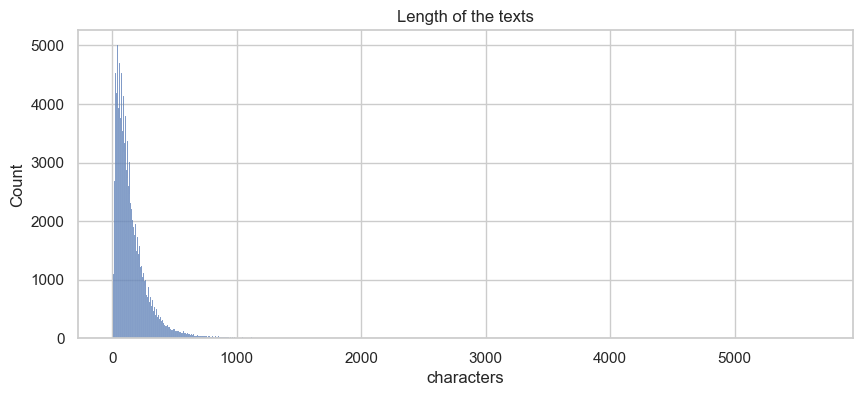

In [19]:
plt.figure(figsize=(10, 4))
sns.histplot(df["characters"])
plt.title("Length of the texts");

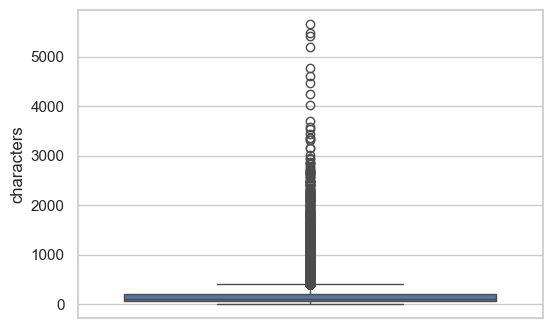

In [20]:
plt.figure(figsize=(6, 4))
sns.boxplot(df["characters"]);

413.5


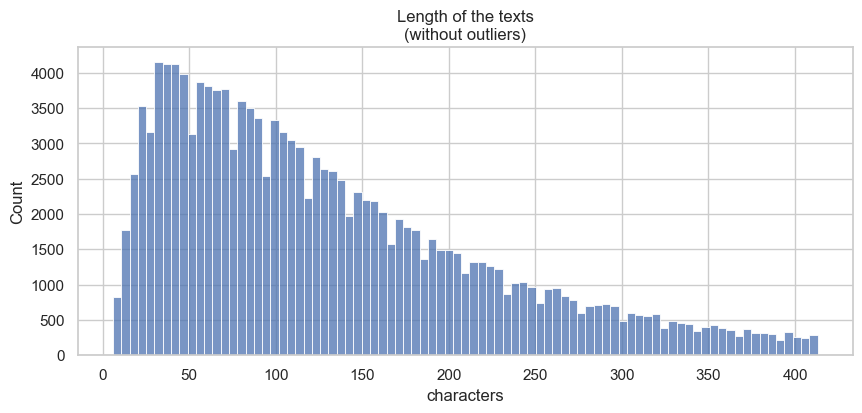

In [21]:
# Without outliers
Q1_char = df["characters"].quantile(0.25)
Q3_char = df["characters"].quantile(0.75)
IQR = Q3_char - Q1_char
outlier_sup_char = Q3_char + 1.5 * IQR
outlier_sup_char

plt.figure(figsize=(10, 4))
sns.histplot(df["characters"][df["characters"]<=outlier_sup_char])
plt.title("Length of the texts\n(without outliers)");
print(outlier_sup_char)

In [22]:
df["characters"][df["characters"]>outlier_sup_char].shape, f'{df["characters"][df["characters"]>outlier_sup_char].shape[0]/df.shape[0]*100}%'

((8392,), '5.643008438960428%')

## By country

In [23]:
countries_long = df.groupby("country_name").agg({"characters" : "mean"}).sort_values("characters", ascending=False).head(10)
countries_long

,characters
country_name,
Trinidad and Tobago,522.903226
Sierra Leone,522.000000
Benin,500.000000
New Caledonia,460.000000
Nigeria,421.785714
Jamaica,350.000000
Zambia,338.666667
Fiji,300.333333
Uzbekistan,263.777778


In [258]:
df.sort_values(by="characters", ascending=False, inplace=True)
for i in countries_long.index:
    rows = df[df["country_name"] == i]["comment"].index
    print("\n", i, "\n",len(rows), "\n", df[df["country_name"] == i]["comment"][rows[0]], df["characters"][rows[0]], df["sentiment"][rows[0]])


 Trinidad and Tobago 
 31 
 Being queer in Trinidad is depressing, that's no secret. Our culture isn't particularly accepting or welcoming of anything that would stray from what's considered normal. Add that together with religious beliefs and you've got a very homophobic environment that we all grow up in. It particularly sucks when you're asked if you're gay. Especially at a young developmental age when people see it within you before you even see it yourself. 

Back in high school, I had a best friend that I loved very much. She and I became practically inseparable whether conversing via text, FB or at school. Her parents took notice of our affection for each other and tried to separate us. It worked...for a while. They insisted that we were too close....but that reasoning was strange to me. Up until that point I'd only had boys as best friends....weren't girls supposed to show each other affection? Was I doing something wrong by telling her that I missed her or admitting that I lo


 Zambia 
 6 
 i bought your perfume a while ago because i always thought you were the best smelling person i’ve ever met, maybe that’s also because i was in love with you but you still are. after i bought it, it hurt to even smell it. it reminded me of you and i don’t know what i expected, it was a while after you and i stopped speaking so maybe that’s why i thoight it wouldn’t affect me as much but it did. sometimes, when i smell the perfume on me in a certain way i smell you and my heart aches, i will always miss you more than anything and i will forever cherish how you made me feel 577 -0.0258

 Fiji 
 6 
 The hardest thing about love is when it is lost, losing someone you have futuristic goals with and having to alter them and set your life back on track without that significant other. When do you let someone you care about so dearly go, when it starts to affect your mental health? when it starts to affect theirs? When there's no spark anymore? When you see it becoming replaced by

In [259]:
countries_short = df.groupby("country_name").agg({"characters" : "mean"}).sort_values("characters", ascending=False).tail(10)
countries_short

,characters
country_name,
Suriname,55.500000
Malawi,50.250000
Turkmenistan,45.750000
North Korea,41.884615
Fr. S. Antarctic Lands,34.500000
Tajikistan,33.600000
Angola,31.428571
Central African Rep.,17.500000
Liberia,17.000000


In [260]:
df.sort_values(by="characters", ascending=True, inplace=True)
for i in countries_short.index:
    rows = df[df["country_name"] == i]["comment"].index
    print("\n", i, "\n",len(rows), "\n", df[df["country_name"] == i]["comment"][rows[0]], df["characters"][rows[0]], df["sentiment"][rows[0]])


 Suriname 
 2 
 We exist, despite the stigma, we’re here 40 nan

 Malawi 
 4 
 Fooled around in my mate's playhouse 36 -0.3818

 Turkmenistan 
 4 
 I love you 10 0.6369

 North Korea 
 26 
 i watched 9 nan

 Fr. S. Antarctic Lands 
 2 
 Là où je noie ma tristesse 26 nan

 Tajikistan 
 5 
 we exist!! 10 nan

 Angola 
 7 
 I’m a lesbian 13 nan

 Central African Rep. 
 2 
 gays reside here 16 nan

 Liberia 
 1 
 Lesbian and proud 17 0.4767

 Burundi 
 1 
 Im gay !!!!! 12 nan


# Emotionality

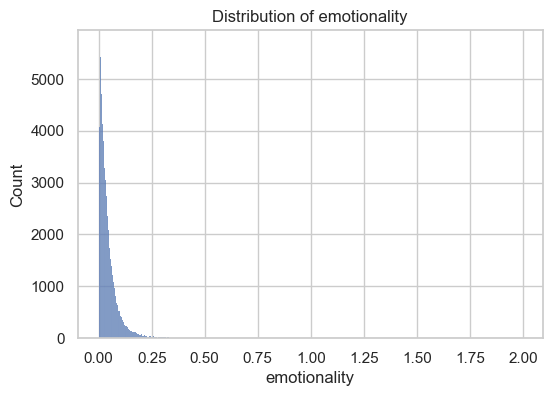

In [24]:
plt.figure(figsize=(6, 4))
sns.histplot(df["emotionality"])
plt.title("Distribution of emotionality");

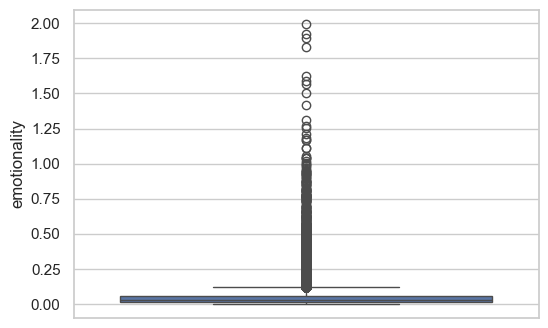

In [25]:
plt.figure(figsize=(6, 4))
sns.boxplot(df["emotionality"]);

0.1234701120522321


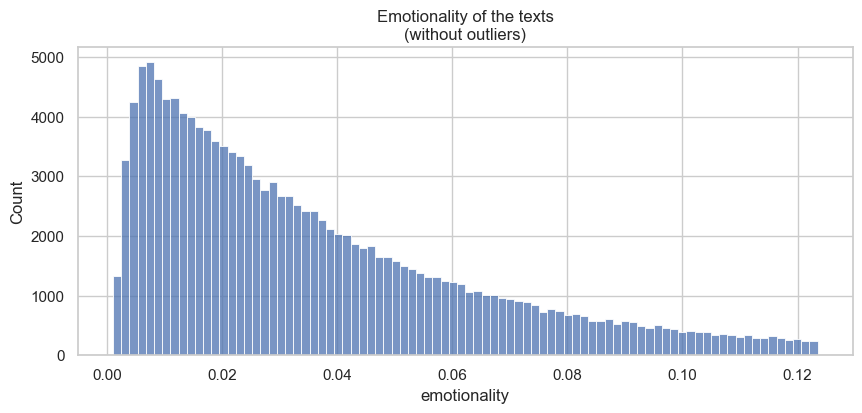

In [26]:
# Without outliers
Q1_emo = df["emotionality"].quantile(0.25)
Q3_emo = df["emotionality"].quantile(0.75)
IQR = Q3_emo - Q1_emo
outlier_sup_emo = Q3_emo + 1.5 * IQR
outlier_sup_emo

plt.figure(figsize=(10, 4))
sns.histplot(df["emotionality"][df["emotionality"]<=outlier_sup_emo])
plt.title("Emotionality of the texts\n(without outliers)");
print(outlier_sup_emo)

In [27]:
df["emotionality"][df["emotionality"]>outlier_sup_emo].shape, f'´{df["emotionality"][df["emotionality"]>outlier_sup_emo].shape[0]/df.shape[0]*100}%'

((9388,), '´6.3127458561678385%')

In [265]:
index = df[df["emotionality"] == df["emotionality"].max()].index[0]
print(df["country_name"][index],"\n", df["comment"][index],"\n", df["emotionality"][index])

United States of America 
 I came out in 6th grade I was 13  I came out to a couple of friends then it spread  was out to my parents yet but later on that year I outed my self texting a friend on my dads phone and forgot to log out of messenger. But that’s not the story I’m telling today. September/23rd/2020 this was the ending of my 7th grade year  so I was at home doing me when I got a notification on snap this boy added me on Snapchat  I didn’t know who he was  when he added me so I added Him back he told me he was from my school I said nice what hallway he said the 7th&8th I said cool  i knew something was up because nobody till this day adds me and text me first Unless they like me or wanna tell me something so we where texting about life and getting to know each other and he is a guy that’s in to a lot of memes I call him the meme king he was sending me all these memes and me I don’t really find memes funny so I was faking texting hah,funny so later late day I was like why did yo

## By country

In [263]:
countries_emo = df.groupby("country_name").agg({"emotionality" : "mean"}).sort_values("emotionality", ascending=False).head(10)
countries_emo

,emotionality
country_name,
Sierra Leone,0.183395
Trinidad and Tobago,0.173233
New Caledonia,0.161239
Nigeria,0.133174
Jamaica,0.113158
Fiji,0.099046
Benin,0.094318
Zambia,0.089004
Uzbekistan,0.082995


In [264]:
df.sort_values(by="emotionality", ascending=False, inplace=True)
for i in countries_emo.index:
    rows = df[df["country_name"] == i]["comment"].index
    print("\n", i, "\n",len(rows), "\n", df[df["country_name"] == i]["comment"][rows[0]], df["emotionality"][rows[0]])


 Sierra Leone 
 1 
 i wish i could tell you aloud that i love you -- just to see the elation in your eyes at being told so. i'm endlessly enamored by you... it's just hard, love. it's dangerous and i know you understand but my guilt is deep. i will get us somewhere, where i can pull you aside and kiss you without fear. where the two of us can be close without suspicion. where i can love you as much as i want and anywhere i please. there will be a place for us dear just wait. it'll be us, my love i promise. hang in there, we will be free 0.1833954473266278

 Trinidad and Tobago 
 31 
 Being queer in Trinidad is depressing, that's no secret. Our culture isn't particularly accepting or welcoming of anything that would stray from what's considered normal. Add that together with religious beliefs and you've got a very homophobic environment that we all grow up in. It particularly sucks when you're asked if you're gay. Especially at a young developmental age when people see it within you be


 Benin 
 1 
 You told me you wanted me to drink enough that I wouldn't be able to tell if you were a man or woman so you could do what you want with me. You were my first kiss after 5 years of celibacy. You showed me how hollow life was without love.

Tu m'as dit que tu voulais que je me saoule assez pour que je ne sache pas si tu étais homme ou femme pour que tu puisses faire ce que tu voulais de moi. Tu étais mon premier baiser après 5 ans de célibat. Tu m'as montré à quel point la vie est vide sans amour. 0.0943179812952179

 Zambia 
 6 
 it was here that i realised i loved you. every single day for 2 years i couldn’t stop thinking about you even when you moved away. you were my first love, the one who made me realise that i liked girls, and the person who still makes me wonder if i’ll ever love someone the way i loved you ever again. sometimes i think i do, but then i’m reminded of you somehow and then i realise i truly will never love or adore someone the way i loved and adored y

In [266]:
countries_notemo = df.groupby("country_name").agg({"emotionality" : "mean"}).sort_values("emotionality", ascending=True).tail(10)
countries_notemo

,emotionality
country_name,
Myanmar,0.081153
Uzbekistan,0.082995
Zambia,0.089004
Benin,0.094318
Fiji,0.099046
Jamaica,0.113158
Nigeria,0.133174
New Caledonia,0.161239
Trinidad and Tobago,0.173233


In [267]:
df.sort_values(by="emotionality", ascending=True, inplace=True)
for i in countries_notemo.index:
    rows = df[df["country_name"] == i]["comment"].index
    print("\n", i, "\n",len(rows), "\n", df[df["country_name"] == i]["comment"][rows[0]], df["emotionality"][rows[0]])


 Myanmar 
 25 
 I kissed him and he kissed me back 0.0098208223045703

 Uzbekistan 
 9 
 I sexted my girlfriend from the British Embassy. 0.0084700899947061

 Zambia 
 6 
 We’re here and we’re queer! 0.0047644256220222

 Benin 
 1 
 You told me you wanted me to drink enough that I wouldn't be able to tell if you were a man or woman so you could do what you want with me. You were my first kiss after 5 years of celibacy. You showed me how hollow life was without love.

Tu m'as dit que tu voulais que je me saoule assez pour que je ne sache pas si tu étais homme ou femme pour que tu puisses faire ce que tu voulais de moi. Tu étais mon premier baiser après 5 ans de célibat. Tu m'as montré à quel point la vie est vide sans amour. 0.0943179812952179

 Fiji 
 6 
 Had the most amazing holiday with my partner!  0.0146977589553555

 Jamaica 
 25 
 I realized I did not want to grow up to be a woman. 0.0095142403388036

 Nigeria 
 28 
 i learned that gender didn't matter when it came to who i love

**HeatMap in Tableau**

In [54]:
df.emotionality.describe() # So that in tableau I can put the center of the colors in the median

count    149490.000000
mean          0.045780
std           0.056146
min           0.000353
25%           0.014117
50%           0.029931
75%           0.057753
max           1.993700
Name: emotionality, dtype: float64

# Words

In [3]:
countries = list(df["country_code"].unique())
len(countries)

169

In [108]:
stop_words = set(stopwords.words("english")) 
df_words = df[df["language"]=="en"]
text = []
for index, rows in df_words.iterrows():
    dirty_text = "".join(rows["comment"])
    words = dirty_text.split()
    for i in words:
        if i.lower() not in stop_words:
            clean_text_en.append(i)
# also by country in Streamlit

In [109]:
pd.DataFrame(pd.Series(clean_text_en).value_counts()).reset_index().head(10).rename(columns={"index":"Top words", "count": ""}).set_index("Top words")

,
Top words,
first,104962
love,56184
time,44910
came,31703
never,28278
still,28254
like,26964
here.,25196
girl,25024


## WordClouds

In [128]:
# stop_words = set(stopwords.words("english")) 
# Instead of using stop_words, I only use english words
lines = df["comment"][df["language"]=="en"]
comments = " ".join(lines)

### Global

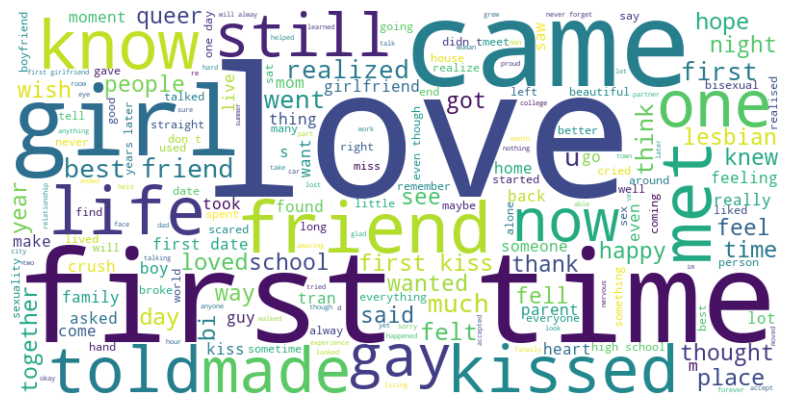

In [129]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(comments)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [130]:
wordcloud.to_file('../images/GlobalCloud.png')